# Art Generation:

### Intro:

this notebook was inspired / done following Convolutioanl Neural Networks Course on Corsera by Andrew Ng.

### What is Art Generation:
Using Neural Style Transfere (which is one of the most widely used optimization techniques in Deep Learning), we can merge two images, named "Content" image, and "Style" image, to creat a "Generated" image that combines both content from "Content" image and style from "Style" image. 

### How to do Art Generation?
Neural Style Transfer (NST) uses a previously trained convolutional network, and builds on top of that. The idea of using a network trained on a different task and applying it to a new task is called transfer learning.

so in this notebook we use VGG-19, a 19-layer version of the VGG network. This model has already been trained on the very large ImageNet database, and has learned to recognize a variety of low level features (at the shallower layers) and high level features (at the deeper layers).

  ### packages:
first thing first, let's import all the necessary libraries for our task.

In [1]:
import scipy.io
import scipy.misc
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
from PIL import Image
import numpy as np
import tensorflow as tf
from tensorflow.python.framework.ops import EagerTensor
import pprint

### Pretrained Model Call:
let's call our VGG19 pretrained model and prepare it to perfrom our task.

Note the VGG network is a tradename for the pre-trained CNN model proposed by Simonyan and Zisserman, in early 2014 at the University of Oxford, UK. VGG (Visual Geometry Group) was trained on ImageNet ILSVRC dataset of 1.3million images consisting of 1000 classes for which 100, 000 images were used for training and 50,000 for validation. VGG-19, a variant of VGG architectures has 19 deeply connected layers which has consistently achieved better performance as compared to other state-of-the-arts model. The model consists of highly connected convolutional and fully-connected layers which enables better feature extraction and, the use of Maxpooling (in the place of average pooling) for downsampling prior classification using SoftMax activation function. The architecture of VGG-19 is as in figure below:







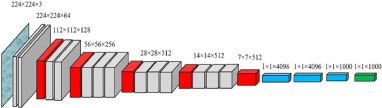

In [3]:
tf.random.set_seed(272) # DO NOT CHANGE THIS VALUE
pp = pprint.PrettyPrinter(indent=4)
img_size = 400
vgg = tf.keras.applications.VGG19(include_top=False,
                                  input_shape=(img_size, img_size, 3),
                                  weights='/content/pretrained_model/vgg19_weights_tf_dim_ordering_tf_kernels_notop.h5')

vgg.trainable = False
pp.pprint(vgg)

### Content Image:
In this notebook we'll try to merge two images, as mentioned previously. First let's see our "Content" image, where in this notebook we used the image of the Royal Liver Building in Liverpool, England.

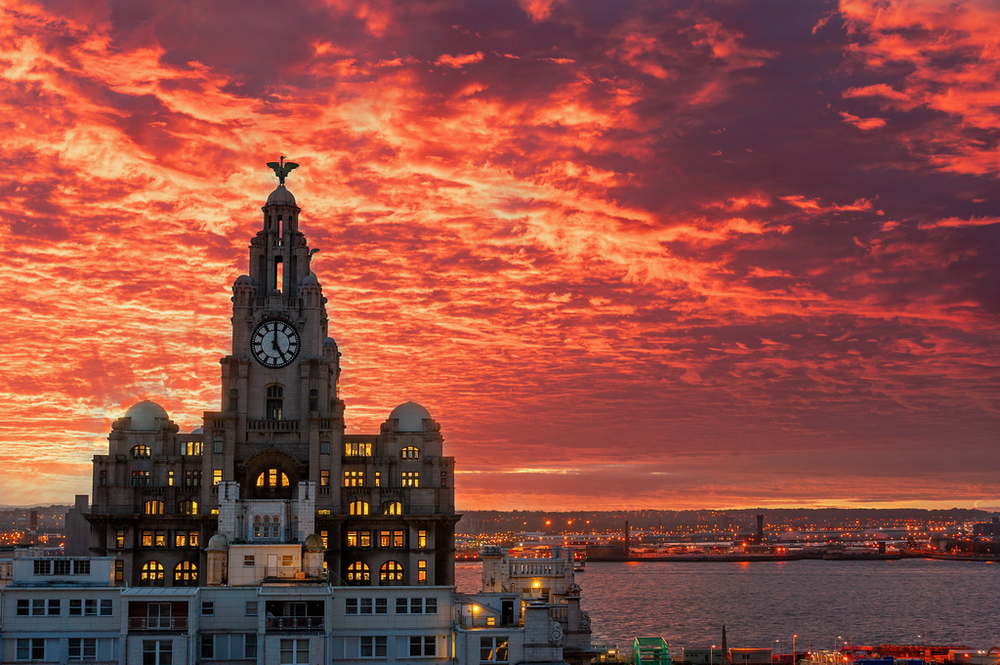

In [4]:
content_image = Image.open("/content/images/liverBuilding.jpg")
content_image

### Content Cost Function:

One goal you should aim for when performing NST is for the content in generated image G to match the content of image C. To do so, you'll need an understanding of shallow versus deep layers:

* The shallower layers of a ConvNet tend to detect lower-level features such as <b>edges and simple textures</b>.
* The deeper layers tend to detect higher-level features such as more <b> complex textures and object classes</b>. 

<b> Content Cost function is given by the Formula:
    
$$J_{content}(C,G) =  \frac{1}{4 \times n_H \times n_W \times n_C}\sum _{ \text{all entries}} (a^{(C)} - a^{(G)})^2\tag{1} $$

* Here, $n_H, n_W$ and $n_C$ are the height, width and number of channels of the hidden layer you have chosen, and appear in a normalization term in the cost. 
* For clarity, note that $a^{(C)}$ and $a^{(G)}$ are the 3D volumes corresponding to a hidden layer's activations. 
* In order to compute the cost $J_{content}(C,G)$, it might also be convenient to unroll these 3D volumes into a 2D matrix, as shown below.
* Technically this unrolling step isn't needed to compute $J_{content}$, but it will be good practice for when you do need to carry out a similar operation later for computing the style cost $J_{style}$.
    
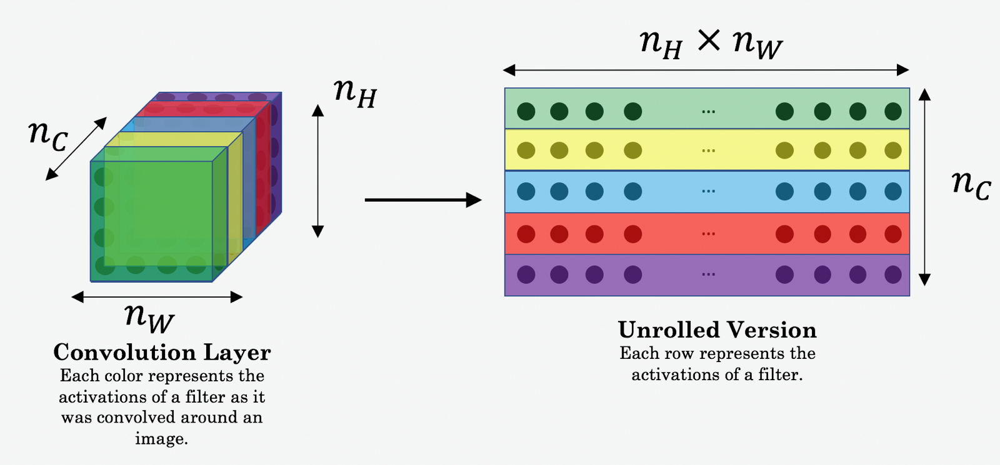

In [5]:
def compute_content_cost(content_output, generated_output):
    """
    Computes the content cost
    
    Arguments:
    a_C -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing content of the image C 
    a_G -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing content of the image G
    
    Returns: 
    J_content -- scalar that you compute using equation 1 above.
    """
    a_C = content_output[-1]
    a_G = generated_output[-1]
    
   
    # Retrieve dimensions from a_G (≈1 line)
    _, n_H, n_W, n_C = a_G.get_shape().as_list()
    
    # Reshape a_C and a_G (≈2 lines)
    a_C_unrolled = tf.transpose(a_C, perm=[0,3,1,2])
    a_G_unrolled = tf.transpose(a_G, perm=[0,3,1,2])
    
    # compute the cost with tensorflow (≈1 line)
    J_content = (1 / (4 * n_H * n_W * n_C)) * tf.reduce_sum(tf.square(tf.subtract(a_C_unrolled, a_G_unrolled)))

    return J_content

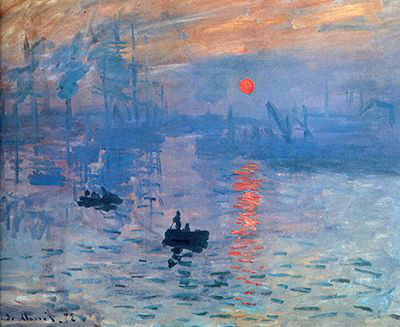

In [6]:
example = Image.open("/content/images/impressionism.jpg")
example

### Style Cost Function:

<b>Gram matrix</b>
* The style matrix is also called a "Gram matrix." 
* In linear algebra, the Gram matrix G of a set of vectors $(v_{1},\dots ,v_{n})$ is the matrix of dot products, whose entries are ${\displaystyle G_{ij} = v_{i}^T v_{j} = np.dot(v_{i}, v_{j})  }$. 
* In other words, $G_{ij}$ compares how similar $v_i$ is to $v_j$: If they are highly similar, you would expect them to have a large dot product, and thus for $G_{ij}$ to be large. 

<b>Compute Gram matrix $G_{gram}$</b>
You will compute the Style matrix by multiplying the "unrolled" filter matrix with its transpose:
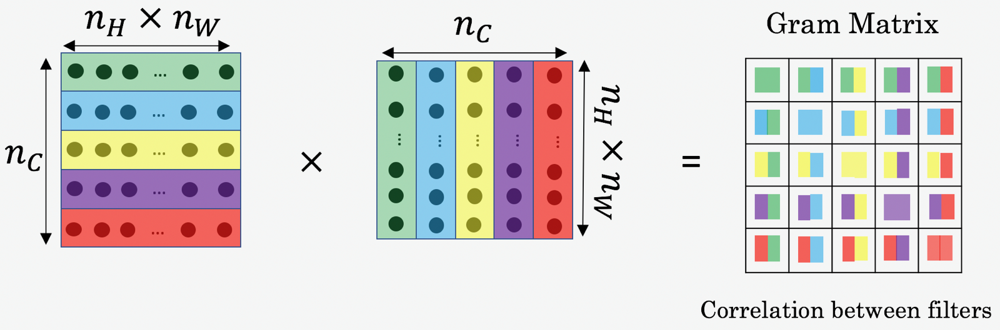


<b>$G_{(gram)ij}$: correlation</b>
The result is a matrix of dimension $(n_C,n_C)$ where $n_C$ is the number of filters (channels). The value $G_{(gram)i,j}$ measures how similar the activations of filter $i$ are to the activations of filter $j$. 

<b>$G_{(gram),ii}$: prevalence of patterns or textures</b>
* The diagonal elements $G_{(gram)ii}$ measure how "active" a filter $i$ is. 
* For example, suppose filter $i$ is detecting vertical textures in the image. Then $G_{(gram)ii}$ measures how common  vertical textures are in the image as a whole.
* If $G_{(gram)ii}$ is large, this means that the image has a lot of vertical texture. 


By capturing the prevalence of different types of features ($G_{(gram)ii}$), as well as how much different features occur together ($G_{(gram)ij}$), the Style matrix $G_{gram}$ measures the style of an image. 

In [7]:
def gram_matrix(A):
    """
    Argument:
    A -- matrix of shape (n_C, n_H*n_W)
    
    Returns:
    GA -- Gram matrix of A, of shape (n_C, n_C)
    """  
   
    GA = tf.matmul(A, tf.transpose(A))

    return GA

We now know how to calculate the Gram matrix. our next goal will be to minimize the distance between the Gram matrix of the "style" image S and the Gram matrix of the "generated" image G. 
* For now, we will use only a single hidden layer $a^{[l]}$.  
* The corresponding style cost for this layer is defined as: 

$$J_{style}^{[l]}(S,G) = \frac{1}{4 \times {n_C}^2 \times (n_H \times n_W)^2} \sum _{i=1}^{n_C}\sum_{j=1}^{n_C}(G^{(S)}_{(gram)i,j} - G^{(G)}_{(gram)i,j})^2\tag{2} $$

* $G_{gram}^{(S)}$ Gram matrix of the "style" image.
* $G_{gram}^{(G)}$ Gram matrix of the "generated" image.
* Make sure you remember that this cost is computed using the hidden layer activations for a particular hidden layer in the network $a^{[l]}$

In [8]:
def compute_layer_style_cost(a_S, a_G):
    """
    Arguments:
    a_S -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing style of the image S 
    a_G -- tensor of dimension (1, n_H, n_W, n_C), hidden layer activations representing style of the image G
    
    Returns: 
    J_style_layer -- tensor representing a scalar value, style cost defined above by equation (2)
    """
  
    
    # Retrieve dimensions from a_G (≈1 line)
    _, n_H, n_W, n_C = a_G.get_shape().as_list()
    
    # Reshape the images to have them of shape (n_C, n_H*n_W) (≈2 lines)
    a_S = tf.reshape(a_S, [n_H * n_W, n_C])
    a_S = tf.transpose(a_S)
    a_G = tf.reshape(a_G, [n_H * n_W, n_C])
    a_G = tf.transpose(a_G)

    # Computing gram_matrices for both images S and G (≈2 lines)
    GS = gram_matrix(a_S)
    GG = gram_matrix(a_G)

    # Computing the loss (≈1 line)
#     factor = (.5 / (n_H * n_W * n_C)) ** 2
#     J_style_layer = factor * tf.reduce_sum(np.power(GS - GG, 2))

    J_style_layer = 1 / (4 * n_C ** 2 * (n_H * n_W) ** 2) * tf.math.reduce_sum(tf.square(tf.subtract(GS, GG)))
    #J_style_layer = None
    
    return J_style_layer

#### Style Weights

* So far you have captured the style from only one layer. 
* You'll get better results if you "merge" style costs from several different layers. 
* Each layer will be given weights ($\lambda^{[l]}$) that reflect how much each layer will contribute to the style.
* After completing this exercise, feel free to come back and experiment with different weights to see how it changes the generated image $G$.
* By default, give each layer equal weight, and the weights add up to 1.  ($\sum_{l}^L\lambda^{[l]} = 1$)


Start by listing the layer names:

In [9]:
for layer in vgg.layers:
    print(layer.name)

input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_conv4
block5_pool


Get a look at the output of a layer `block5_conv3`. We will later define this as the content layer, which will represent the image.

In [10]:
vgg.get_layer('block5_conv3').output

<KerasTensor: shape=(None, 25, 25, 512) dtype=float32 (created by layer 'block5_conv3')>

Now choose layers to represent the style of the image and assign style costs:

In [11]:
STYLE_LAYERS = [
    ('block1_conv1', 0.2),
    ('block2_conv1', 0.2),
    ('block3_conv1', 0.2),
    ('block4_conv1', 0.2),
    ('block5_conv1', 0.2)]

### Compute style cost

<b> Instructions: </b>
* A compute_style_cost(...) function has already been implemented. 
* It calls your `compute_layer_style_cost(...)` several times, and weights their results using the values in `STYLE_LAYERS`. 
* Please read over it to make sure you understand what it's doing. 

#### Description of `compute_style_cost`
For each layer:
* Select the activation (the output tensor) of the current layer.
* Get the style of the style image "S" from the current layer.
* Get the style of the generated image "G" from the current layer.
* Compute the "style cost" for the current layer
* Add the weighted style cost to the overall style cost (J_style)

Once we're done with the loop:  
* Return the overall style cost.

In [12]:
def compute_style_cost(style_image_output, generated_image_output, STYLE_LAYERS=STYLE_LAYERS):
    """
    Computes the overall style cost from several chosen layers
    
    Arguments:
    style_image_output -- our tensorflow model
    generated_image_output --
    STYLE_LAYERS -- A python list containing:
                        - the names of the layers we would like to extract style from
                        - a coefficient for each of them
    
    Returns: 
    J_style -- tensor representing a scalar value, style cost defined above by equation (2)
    """
    
    # initialize the overall style cost
    J_style = 0

    # Set a_S to be the hidden layer activation from the layer we have selected.
    # The last element of the array contains the content layer image, which must not be used.
    a_S = style_image_output[:-1]

    # Set a_G to be the output of the choosen hidden layers.
    # The last element of the list contains the content layer image which must not be used.
    a_G = generated_image_output[:-1]
    for i, weight in zip(range(len(a_S)), STYLE_LAYERS):  
        # Compute style_cost for the current layer
        J_style_layer = compute_layer_style_cost(a_S[i], a_G[i])

        # Add weight * J_style_layer of this layer to overall style cost
        J_style += weight[1] * J_style_layer

    return J_style

### Total Cost:

Finally, we will create a cost function that minimizes both the style and the content cost. The formula is: 

$$J(G) = \alpha J_{content}(C,G) + \beta J_{style}(S,G)$$

In [13]:
def total_cost(J_content, J_style, alpha = 10, beta = 40):
    """
    Computes the total cost function
    
    Arguments:
    J_content -- content cost coded above
    J_style -- style cost coded above
    alpha -- hyperparameter weighting the importance of the content cost
    beta -- hyperparameter weighting the importance of the style cost
    
    Returns:
    J -- total cost as defined by the formula above.
    """
  
    J = alpha * J_content + beta * J_style
    

    return J

Finally, we get to put everything together to implement Neural Style Transfer!


Here's what our program is able to do:

1. Load the content image 
2. Load the style image
3. Randomly initialize the image to be generated 
4. Load the VGG19 model
5. Compute the content cost
6. Compute the style cost
7. Compute the total cost
8. Define the optimizer and learning rate

### Load Content Image:
Run the following code cell to load, reshape, and normalize our "content" image.

(1, 400, 400, 3)


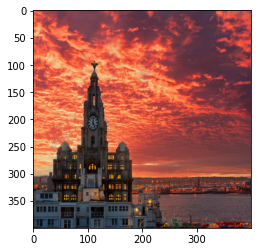

In [14]:
content_image = np.array(Image.open("/content/images/liverBuilding.jpg").resize((img_size, img_size)))
content_image = tf.constant(np.reshape(content_image, ((1,) + content_image.shape)))

print(content_image.shape)
imshow(content_image[0])
plt.show()

### Load Style Image:
Now load, reshape and normalize our "style" image

(1, 400, 400, 3)


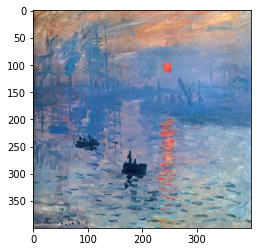

In [15]:
style_image =  np.array(Image.open("/content/images/impressionism.jpg").resize((img_size, img_size)))
style_image = tf.constant(np.reshape(style_image, ((1,) + style_image.shape)))

print(style_image.shape)
imshow(style_image[0])
plt.show()

### Randomly Initialize the Image to be Generated
Now, you get to initialize the "generated" image as a noisy image created from the content_image.

* The generated image is slightly correlated with the content image.
* By initializing the pixels of the generated image to be mostly noise but slightly correlated with the content image, this will help the content of the "generated" image more rapidly match the content of the "content" image. 

(1, 400, 400, 3)


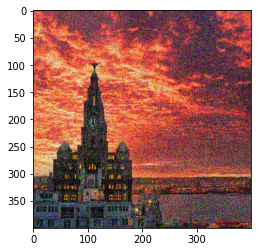

In [16]:
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
noise = tf.random.uniform(tf.shape(generated_image), -0.25, 0.25)
generated_image = tf.add(generated_image, noise)
generated_image = tf.clip_by_value(generated_image, clip_value_min=0.0, clip_value_max=1.0)

print(generated_image.shape)
imshow(generated_image.numpy()[0])
plt.show()

<b>Now, let's define a function which loads the VGG19 model and returns a list of the outputs for the middle layers.</b>

In [17]:
def get_layer_outputs(vgg, layer_names):
    """ Creates a vgg model that returns a list of intermediate output values."""
    outputs = [vgg.get_layer(layer[0]).output for layer in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model

<b>Now, define the content layer and build the model.</b>

In [18]:
content_layer = [('block5_conv3', 1)]

vgg_model_outputs = get_layer_outputs(vgg, STYLE_LAYERS + content_layer)

<b>Save the outputs for the content and style layers in separate variables.</b>

In [19]:
content_target = vgg_model_outputs(content_image)  # Content encoder
style_targets = vgg_model_outputs(style_image)     # Style enconder

### Compute the Content image Encoding (a_C)

we've built the model, and now to compute the content cost, we will encode your content image using the appropriate hidden layer activations. Set this encoding to the variable `a_C`. Later in the assignment, we will need to do the proper with the generated image, by setting the variable `a_G` to be the appropriate hidden layer activations. we will use layer `block5_conv3` to compute the encoding. The code below does the following:

Set a_C to be the tensor giving the hidden layer activation for layer "block5_conv4" using the content image.

In [20]:
preprocessed_content =  tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
a_C = vgg_model_outputs(preprocessed_content)

### Compute the Style image Encoding (a_S) 

The code below sets a_S to be the tensor giving the hidden layer activation for `STYLE_LAYERS` using our style image.

In [21]:
preprocessed_style =  tf.Variable(tf.image.convert_image_dtype(style_image, tf.float32))
a_S = vgg_model_outputs(preprocessed_style)

Below are the utils that we will need to display the images generated by the style transfer model.

In [23]:
def clip_0_1(image):
    """
    Truncate all the pixels in the tensor to be between 0 and 1
    
    Arguments:
    image -- Tensor
    J_style -- style cost coded above

    Returns:
    Tensor
    """
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

def tensor_to_image(tensor):
    """
    Converts the given tensor into a PIL image
    
    Arguments:
    tensor -- Tensor
    
    Returns:
    Image: A PIL image
    """
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return Image.fromarray(tensor)

In [24]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

def train_step(generated_image):
    with tf.GradientTape() as tape:
        # In this function you must use the precomputed encoded images a_S and a_C
        # Compute a_G as the vgg_model_outputs for the current generated image
       
        a_G = vgg_model_outputs(generated_image)          
       
        # Compute the style cost

        #list 
        J_style = compute_style_cost(a_S,a_G)
        # Compute the content cost
        J_content = compute_content_cost(a_C,a_G)
        # Compute the total cost
        J = total_cost( J_content, J_style, alpha = 10, beta =40 ) 

        
    grad = tape.gradient(J, generated_image)

    optimizer.apply_gradients([(grad, generated_image)])
    generated_image.assign(clip_0_1(generated_image))

    return J

In [25]:
generated_image = tf.Variable(generated_image)


J1 = train_step(generated_image)
print(J1)

tf.Tensor(27545.11, shape=(), dtype=float32)


Epoch 0 


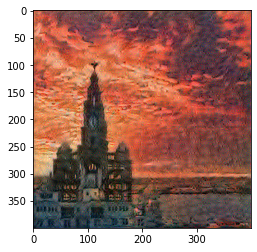

Epoch 250 


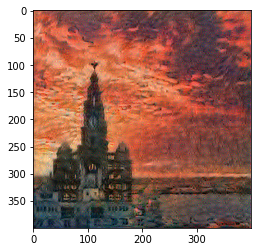

Epoch 500 


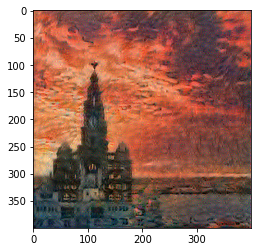

Epoch 750 


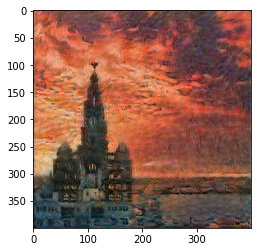

Epoch 1000 


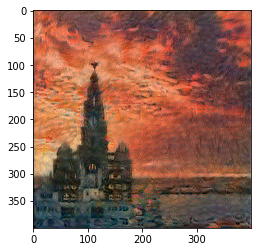

Epoch 1250 


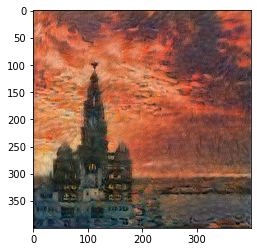

Epoch 1500 


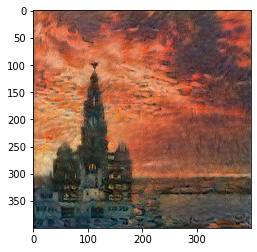

Epoch 1750 


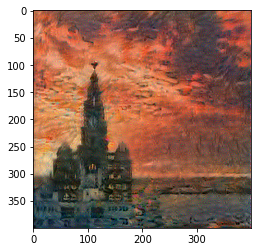

Epoch 2000 


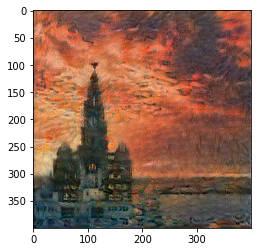

Epoch 2250 


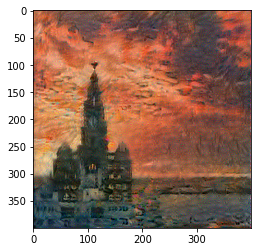

Epoch 2500 


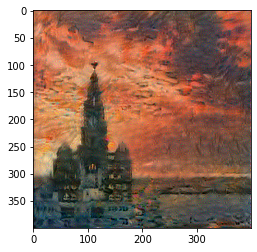

Epoch 2750 


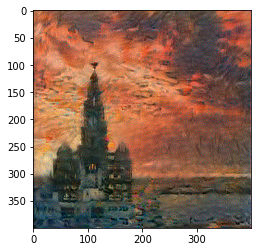

Epoch 3000 


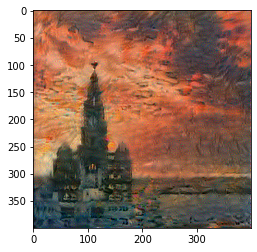

Epoch 3250 


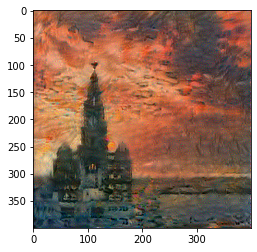

Epoch 3500 


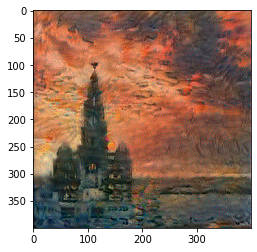

Epoch 3750 


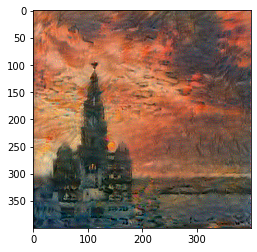

Epoch 4000 


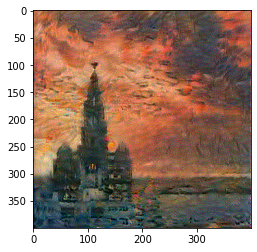

Epoch 4250 


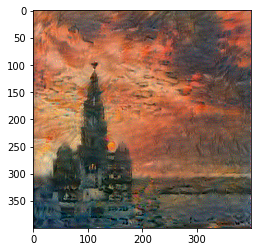

Epoch 4500 


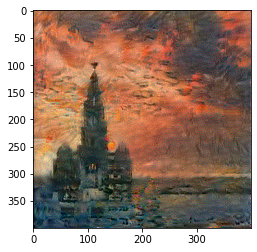

Epoch 4750 


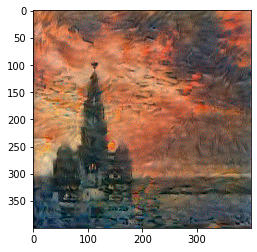

Epoch 5000 


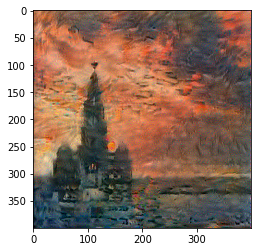

Epoch 5250 


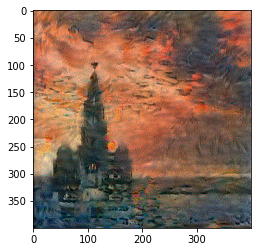

Epoch 5500 


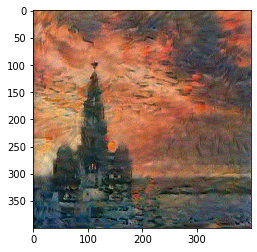

Epoch 5750 


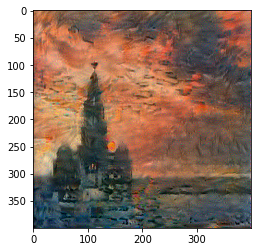

Epoch 6000 


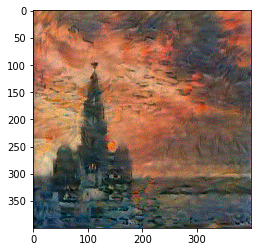

Epoch 6250 


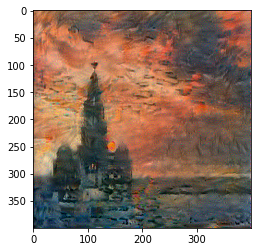

Epoch 6500 


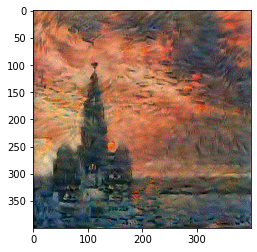

Epoch 6750 


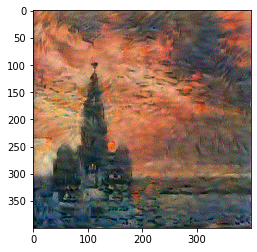

Epoch 7000 


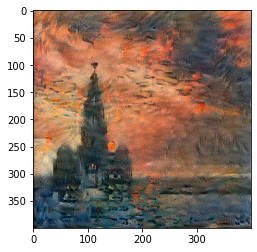

Epoch 7250 


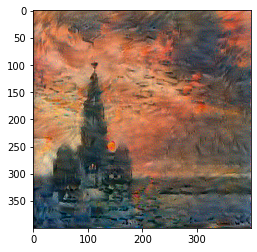

Epoch 7500 


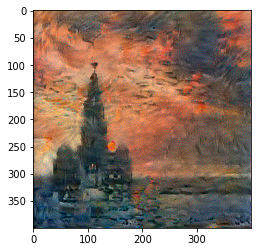

Epoch 7750 


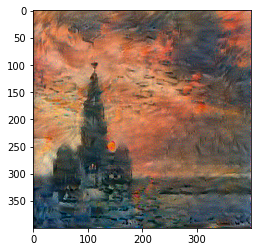

Epoch 8000 


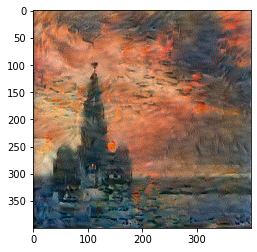

Epoch 8250 


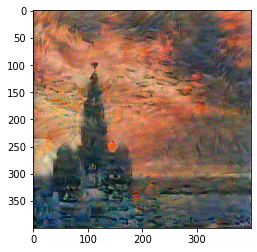

Epoch 8500 


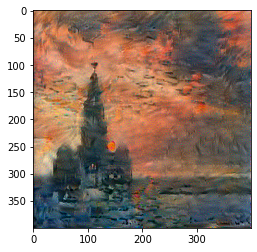

Epoch 8750 


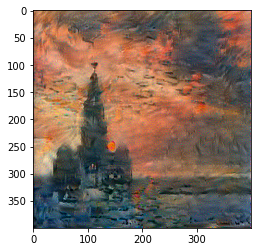

Epoch 9000 


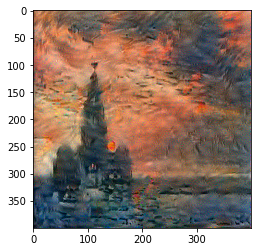

Epoch 9250 


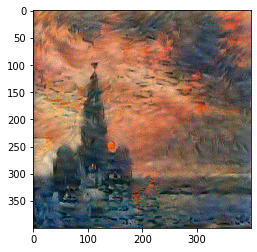

Epoch 9500 


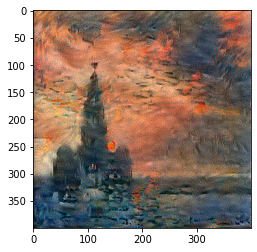

Epoch 9750 


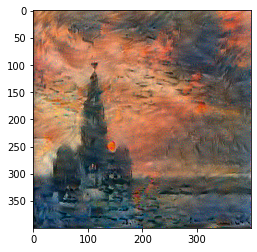

Epoch 10000 


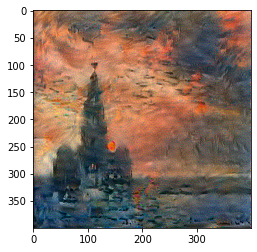

Epoch 10250 


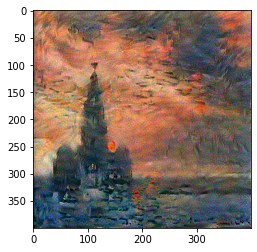

Epoch 10500 


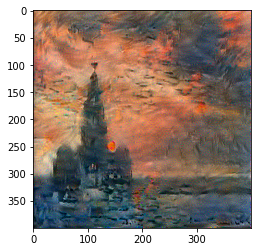

Epoch 10750 


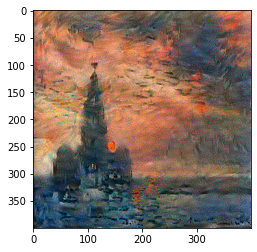

Epoch 11000 


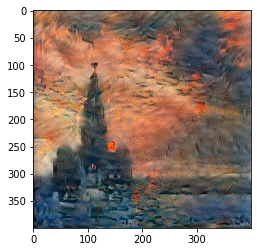

Epoch 11250 


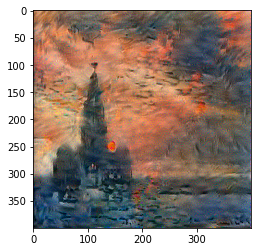

Epoch 11500 


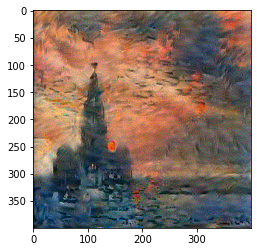

Epoch 11750 


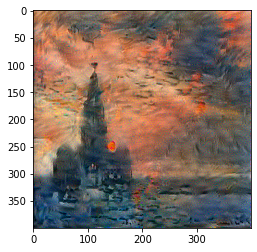

Epoch 12000 


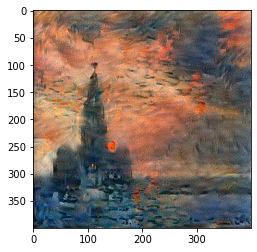

Epoch 12250 


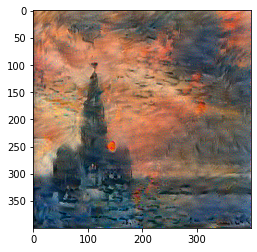

Epoch 12500 


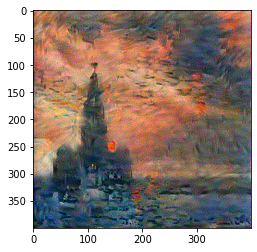

Epoch 12750 


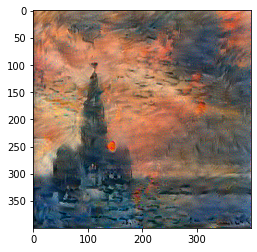

Epoch 13000 


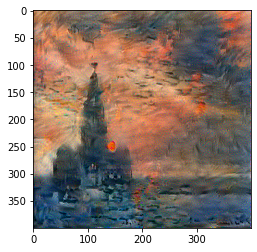

Epoch 13250 


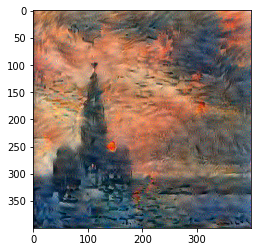

Epoch 13500 


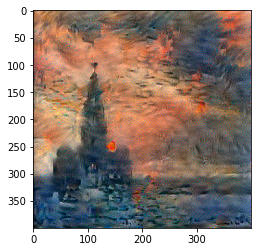

Epoch 13750 


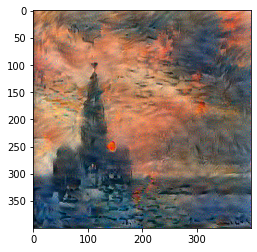

Epoch 14000 


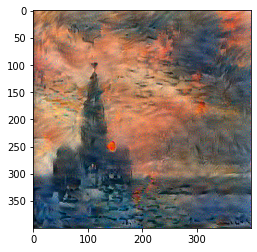

Epoch 14250 


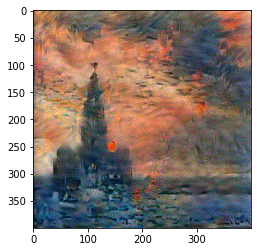

Epoch 14500 


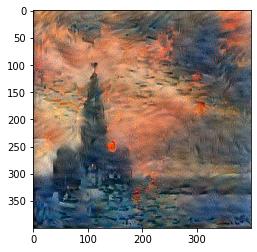

Epoch 14750 


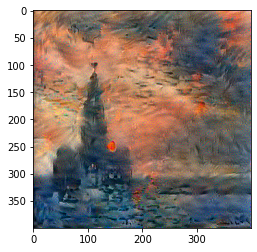

Epoch 15000 


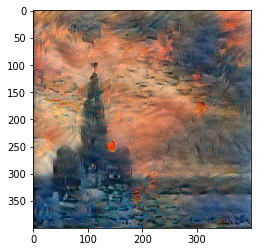

Epoch 15250 


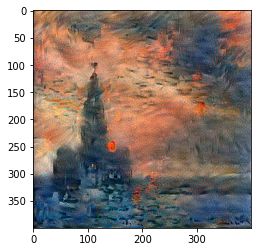

Epoch 15500 


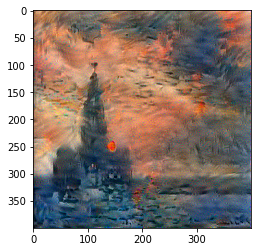

Epoch 15750 


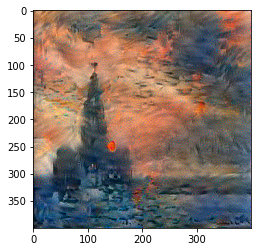

Epoch 16000 


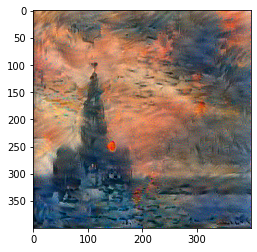

Epoch 16250 


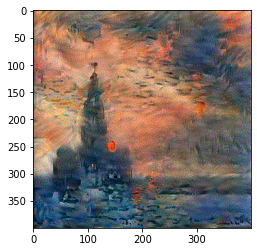

Epoch 16500 


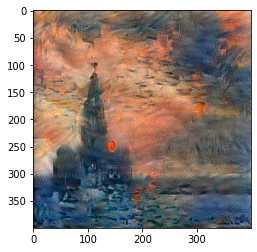

Epoch 16750 


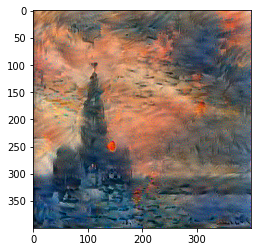

Epoch 17000 


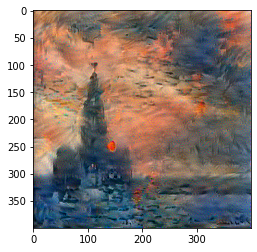

Epoch 17250 


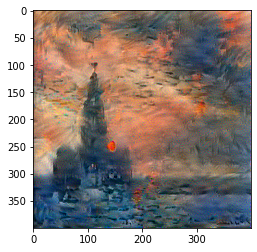

Epoch 17500 


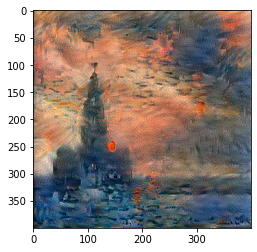

Epoch 17750 


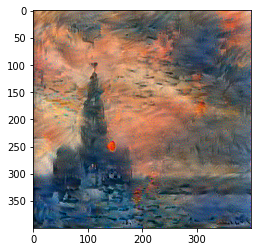

Epoch 18000 


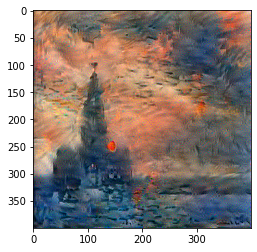

Epoch 18250 


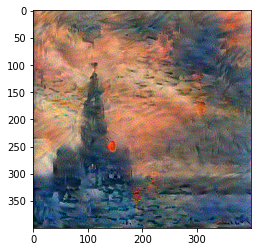

Epoch 18500 


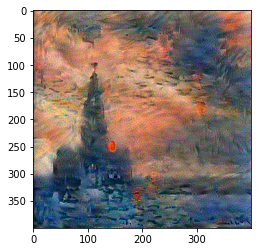

Epoch 18750 


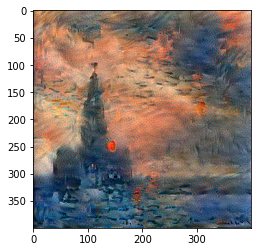

Epoch 19000 


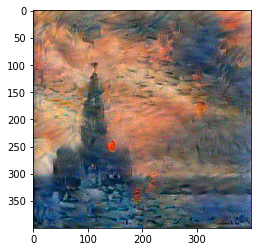

Epoch 19250 


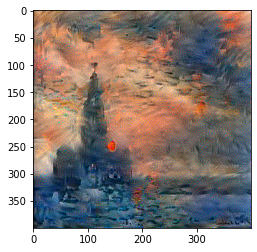

Epoch 19500 


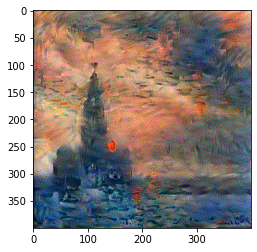

Epoch 19750 


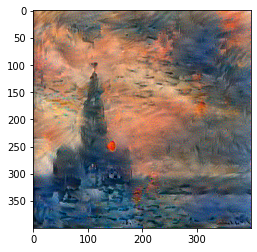

In [27]:
epochs = 20000 
for i in range(epochs):
    train_step(generated_image)
    if i % 250 == 0:
        print(f"Epoch {i} ")
    if i % 250 == 0:
        image = tensor_to_image(generated_image)
        imshow(image)
        image.save(f"/content/output/image_{i}.jpg")
        plt.show() 

<b>et voila !!!, let's plot our images all together and see what we acheived</b>

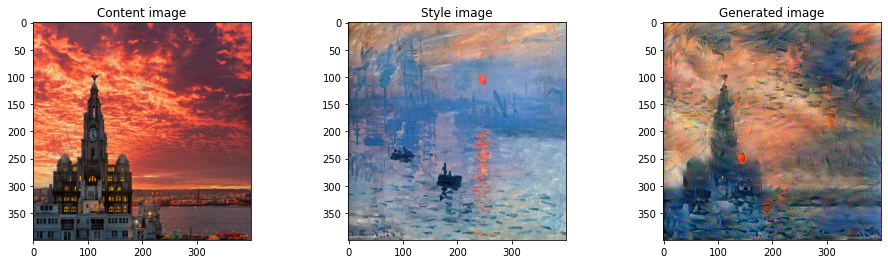

In [28]:
fig = plt.figure(figsize=(16, 4))
ax = fig.add_subplot(1, 3, 1)
imshow(content_image[0])
ax.title.set_text('Content image')
ax = fig.add_subplot(1, 3, 2)
imshow(style_image[0])
ax.title.set_text('Style image')
ax = fig.add_subplot(1, 3, 3)
imshow(generated_image[0])
ax.title.set_text('Generated image')
plt.show()

### References

The Neural Style Transfer algorithm was due to Gatys et al. (2015). Harish Narayanan and Github user "log0" also have highly readable write-ups this lab was inspired by. The pre-trained network used in this implementation is a VGG network, which is due to Simonyan and Zisserman (2015). Pre-trained weights were from the work of the MathConvNet team. 

- Leon A. Gatys, Alexander S. Ecker, Matthias Bethge, (2015). [A Neural Algorithm of Artistic Style](https://arxiv.org/abs/1508.06576) 
- Harish Narayanan, [Convolutional neural networks for artistic style transfer.](https://harishnarayanan.org/writing/artistic-style-transfer/)
- Log0, [TensorFlow Implementation of "A Neural Algorithm of Artistic Style".](http://www.chioka.in/tensorflow-implementation-neural-algorithm-of-artistic-style)
- Karen Simonyan and Andrew Zisserman (2015). [Very deep convolutional networks for large-scale image recognition](https://arxiv.org/pdf/1409.1556.pdf)
- [MatConvNet.](http://www.vlfeat.org/matconvnet/pretrained/)